In [1]:
#dependencies (matrix math) 
import numpy as np

In [2]:
import pandas as pd
data=pd.read_csv('CircuitTruthtable.csv')
inputArg=data.ix[:,0:3]
outputArg=data.ix[:,['Output0','Output1','Output2','Output3']]

In [3]:
outputM=outputArg.as_matrix()

In [4]:
inputM=inputArg.as_matrix()

In [5]:
#input data
input_data = inputM;
                
output_labels = outputM;

print(tuple(reversed(input_data.shape)))
print(output_labels.shape)

(3, 8)
(8, 4)


In [6]:
# sigmoid function
def activate(x,deriv=False):
    if(deriv==True):
        return x*(1-x)
    return 1/(1+np.exp(-x))

In [7]:
# 2 layer of neural network : 2 set of weight values
synaptic_weight_0 = 2*np.random.random(tuple(reversed(input_data.shape))) - 1
synaptic_weight_1 = 2*np.random.random(output_labels.shape) - 1

print(synaptic_weight_0.shape)
print(synaptic_weight_1.shape)

(3, 8)
(8, 4)


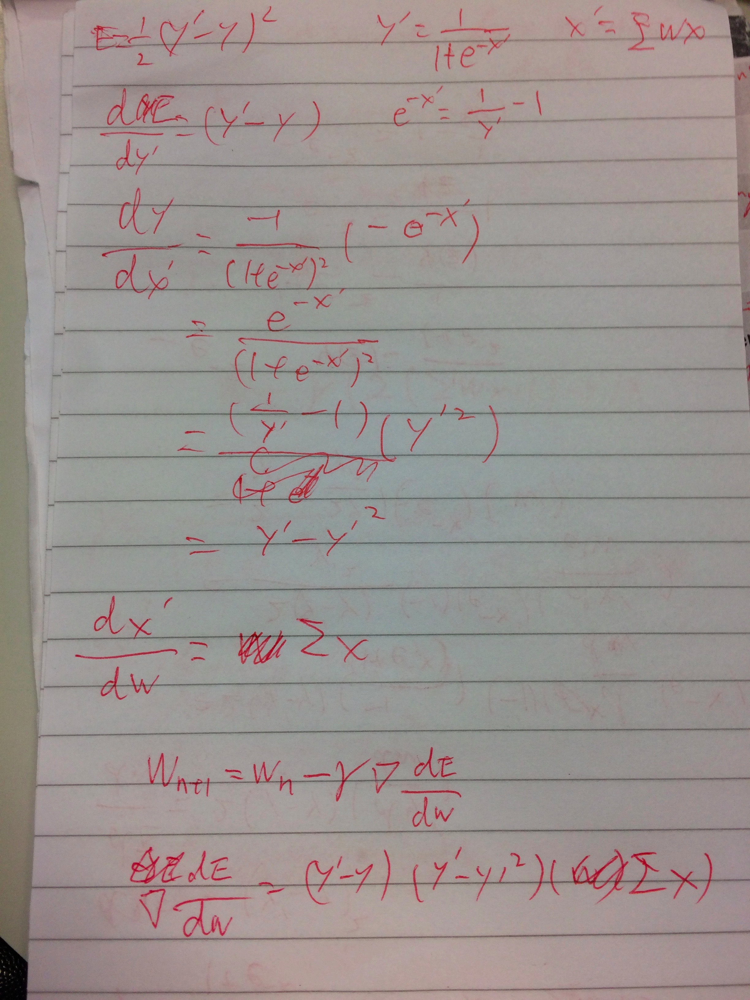

In [8]:
#Traing by gradient decent
trainsteps=60000
for j in range(trainsteps):

	# Forward propagate through layers 0, 1, and 2
    layer0 = input_data
    layer1 = activate(np.dot(layer0,synaptic_weight_0))
    layer2 = activate(np.dot(layer1,synaptic_weight_1))

    #calculate error for layer 2
    layer2_error = output_labels - layer2
    
    if (j% 10000) == 0:
        print ("Error:" + str(np.mean(np.abs(layer2_error))) )
        
    #Use it to compute the gradient
    layer2_gradient = layer2_error*activate(layer2,deriv=True)

    #calculate error for layer 1
    layer1_error = layer2_gradient.dot(synaptic_weight_1.T)
    
    #Use it to compute its gradient
    layer1_gradient = layer1_error * activate(layer1,deriv=True)
    
    #update the weights using the gradients
    synaptic_weight_1 += layer1.T.dot(layer2_gradient)
    synaptic_weight_0 += layer0.T.dot(layer1_gradient)


Error:0.52336168895
Error:0.00624278463679
Error:0.00434253600684
Error:0.003517919345
Error:0.00303146723733
Error:0.00270174601272


In [11]:
#testing
syn0=synaptic_weight_0
layer1 = activate(np.dot(np.array([0, 1, 1]), syn0))
#print(layer1)
syn0=synaptic_weight_1
layer2 = activate(np.dot(layer1, syn0))
print (np.round(layer2))

[ 1.  1.  0.  0.]


In [13]:
syn0=synaptic_weight_0
layer1 = activate(np.dot(np.array([1, 1, 1]), syn0))
#print(layer1)
syn0=synaptic_weight_1
layer2 = activate(np.dot(layer1, syn0))
print (np.round(layer2))

[ 0.  1.  0.  1.]
